TODO's

- Find a way predict the full train and validation sets
- Compare segmentation metrics between models in train and validation sets
- Add this functions to jeroHelper
- Find a better way to visualize results
- Think about filtering predictions with small area

# Research related questions

## Does a bigger patch size improve prediction?

Judging by the comparison between (models) it doesn't seem to be a clear improvement on the prediction performance since ... 

## Using random patches (vs proxy labels) for sampling in reconstruction pretext model improves performance on the pretrained model

It seems that it doesn't because...

## 

In [1]:
from jeroHelper.setupUtils import append_deepfinder_path, get_tomo_indices, PARENT_PATH
append_deepfinder_path()

from jeroHelper.trainHelper import make_trainer
from jeroHelper.coordGen import OLMaker
from jeroHelper.showcaseResults import (predict_fullTomogram, load_model, load_tomoData, Tversky_index,
                                        fullTomogram_modelComparison, make_comparison_plot, write_comparison_gif, save_classPred)


from deepfinder.utils.common import read_array

import numpy as np
import matplotlib.pyplot as plt
import random
import mrcfile
import pandas as pd
import torch

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

In [2]:
train_tomos = ['tomo02', 'tomo03', 'tomo04', 'tomo17']
concat_train_ids = sorted([s.replace('tomo', '') for s in train_tomos])
concat_train_ids = '-'.join(concat_train_ids)

val_tomos = ['tomo32', 'tomo10']
concat_val_ids = sorted([s.replace('tomo', '') for s in val_tomos])
concat_val_ids = '-'.join(concat_val_ids)

test_tomos = ['tomo38']

objectList_maker = OLMaker(train_tomos, val_tomos, test_tomos, 500, 300, 0, None, None)

Pairs of tomo IDs to indices:
[('tomo02_patch000', 0), ('tomo02_patch001', 1), ('tomo02_patch002', 2), ('tomo02_patch003', 3), ('tomo02_patch004', 4), ('tomo02_patch005', 5), ('tomo02_patch006', 6), ('tomo02_patch020', 7), ('tomo02_patch021', 8), ('tomo02_patch030', 9), ('tomo03_patch000', 10), ('tomo03_patch002', 11), ('tomo03_patch004', 12), ('tomo03_patch006', 13), ('tomo03_patch008', 14), ('tomo03_patch010', 15), ('tomo03_patch020', 16), ('tomo03_patch021', 17), ('tomo03_patch022', 18), ('tomo03_patch030', 19), ('tomo03_patch031', 20), ('tomo03_patch032', 21), ('tomo04_patch000', 22), ('tomo04_patch002', 23), ('tomo04_patch004', 24), ('tomo04_patch006', 25), ('tomo04_patch008', 26), ('tomo04_patch009', 27), ('tomo04_patch020', 28), ('tomo04_patch021', 29), ('tomo04_patch030', 30), ('tomo10_patch001', 31), ('tomo10_patch002', 32), ('tomo10_patch003', 33), ('tomo10_patch009', 34), ('tomo10_patch010', 35), ('tomo10_patch011', 36), ('tomo10_patch020', 37), ('tomo10_patch030', 38), ('to

In [3]:
model_fileList = [PARENT_PATH+'models/2.09_baselineModel_ep600_in56_lr0.000100_v2.model',
                  PARENT_PATH+'models/2.09_lowBaselineModel_ep600_in56_lr0.000100_v1.model',
                  PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0.model',
                  PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3.model']
# model_fileList = [PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0.model',
#                   PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3.model']
n_centers_list = [4 for _ in range(len(model_fileList))]

# Training tomogram prediction

In [5]:


training_tomo_patches = [f for f in objectList_maker.tomo_ids if f.startswith(train_tomos[0]) or f.startswith(train_tomos[1])]
for t in training_tomo_patches:
    
    aux_idx = objectList_maker.ids2idxs[t]
    
    tomo_file = objectList_maker.path_data[aux_idx]
    label_file = objectList_maker.path_target[aux_idx]
    
    class1_predDict, dice1_dict, class1, tomogram_data = fullTomogram_modelComparison(model_fileList, n_centers_list, tomo_file, label_file)
    print(dice1_dict, '\n')
    break

Tomogram shape:  (160, 160, 160)
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:04<00:00, 14.24it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.73it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.57it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.67it/s]


Saving model predictions...
{'2.09_baselineModel_ep600_in56_lr0.000100_v2': tensor([0.6521, 0.6917, 0.0000], device='cuda:0'), '2.09_lowBaselineModel_ep600_in56_lr0.000100_v1': tensor([0.6516, 0.7030, 0.0000], device='cuda:0'), '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0': tensor([0.6814, 0.5837, 0.0000], device='cuda:0'), '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3': tensor([0.6505, 0.7165, 0.0000], device='cuda:0')} 



In [4]:
tomo_file

'/home/haicu/jeronimo.carvajal/Thesis/data/nnUnet/Task143_cryoET7/imagesTr/tomo02_patch000_0000.nii.gz'

In [6]:
np.unique(class1_predDict['2.09_baselineModel_ep600_in56_lr0.000100_v2'])

array([0, 1])

In [7]:
class1.shape

torch.Size([3, 160, 160, 160])

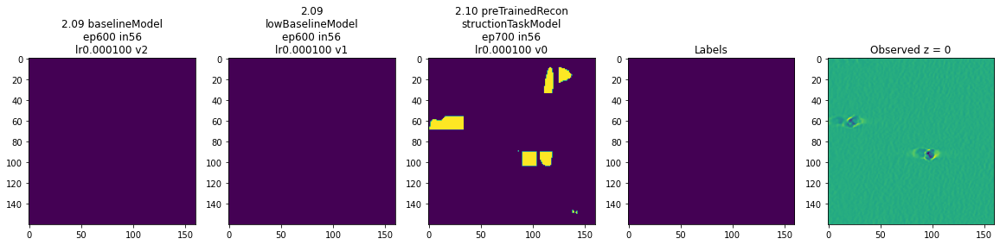

<Figure size 432x288 with 0 Axes>

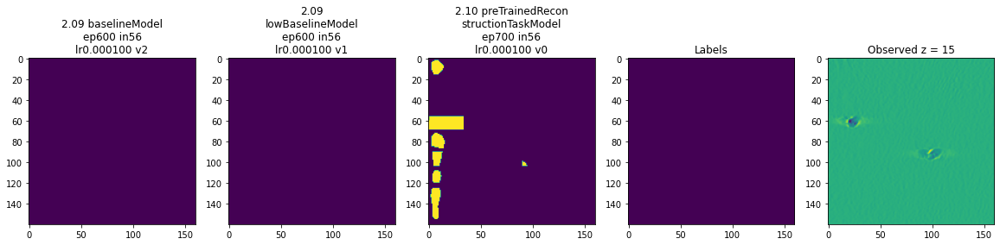

<Figure size 432x288 with 0 Axes>

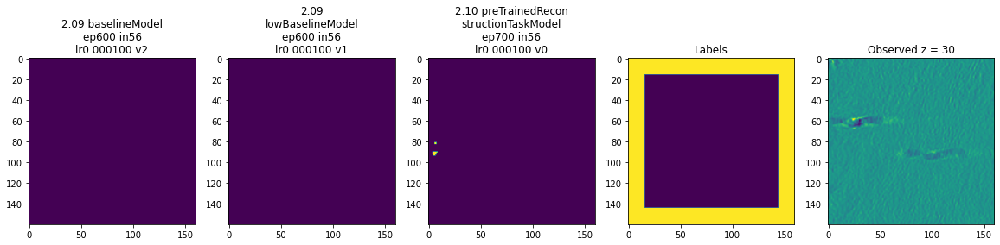

<Figure size 432x288 with 0 Axes>

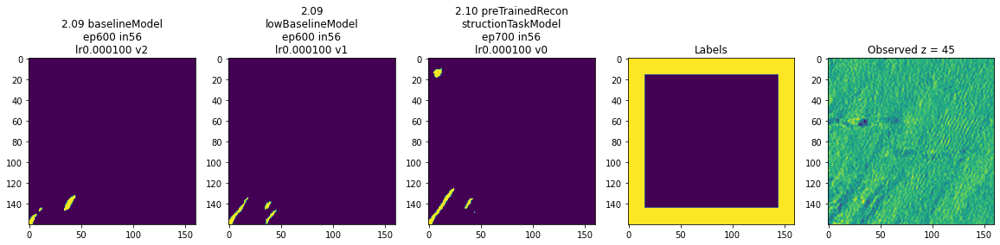

<Figure size 432x288 with 0 Axes>

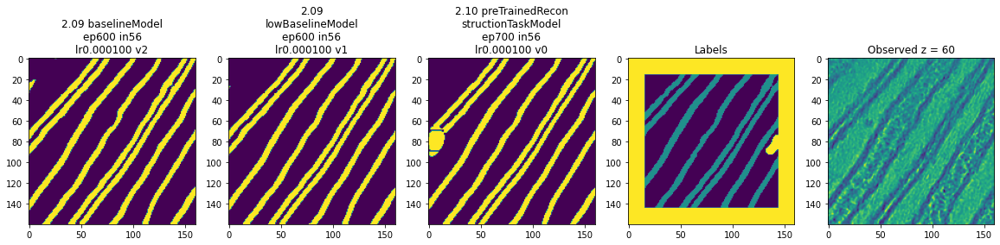

<Figure size 432x288 with 0 Axes>

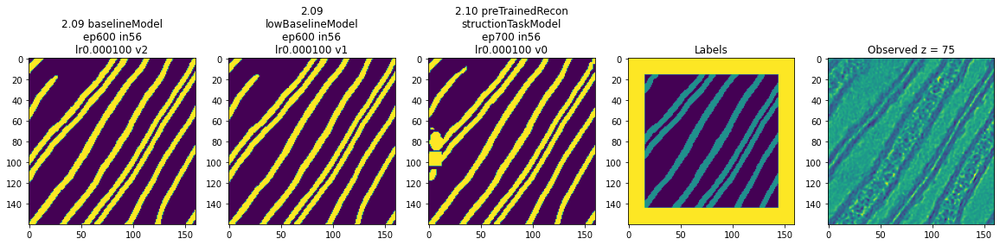

<Figure size 432x288 with 0 Axes>

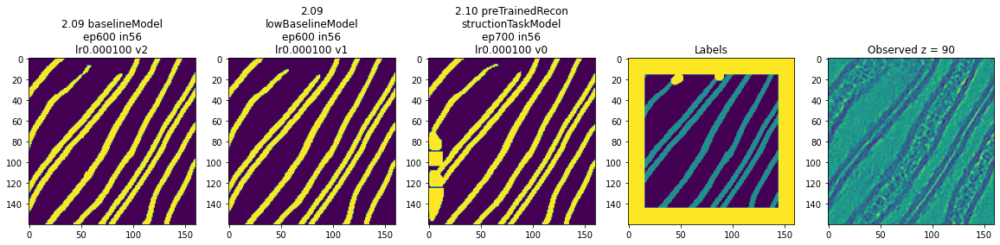

<Figure size 432x288 with 0 Axes>

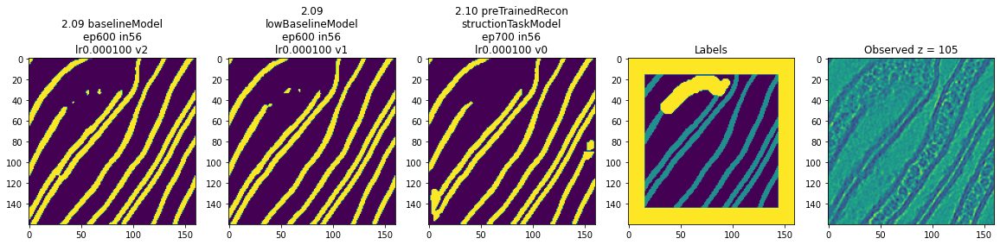

<Figure size 432x288 with 0 Axes>

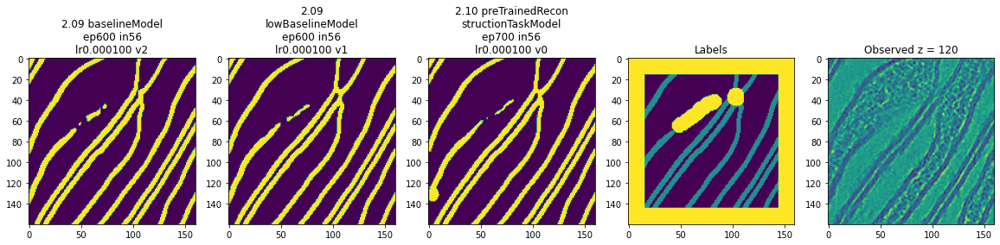

<Figure size 432x288 with 0 Axes>

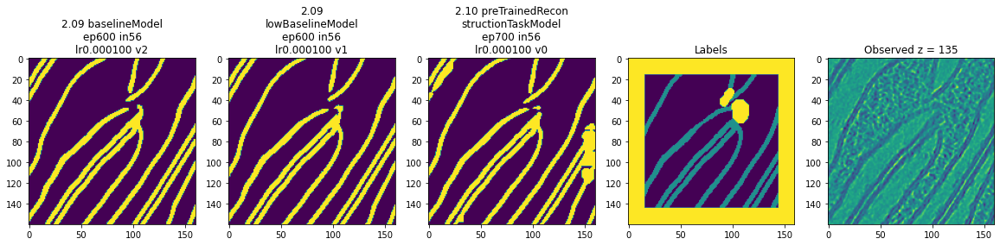

<Figure size 432x288 with 0 Axes>

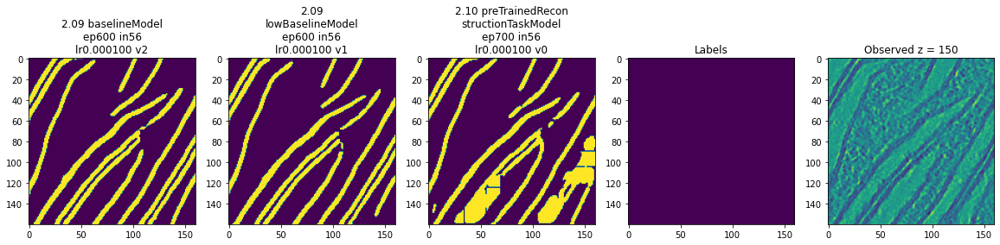

<Figure size 432x288 with 0 Axes>

In [8]:
make_comparison_plot(class1_predDict, class1, tomogram_data)

# Validation tomogram prediction

In [7]:
# model_fileList = [PARENT_PATH+'models/2.09_baselineModel_ep600_in56_lr0.000100_v2.model',
#                   PARENT_PATH+'models/2.09_lowBaselineModel_ep600_in56_lr0.000100_v1.model',
#                   PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0.model']
# n_centers_list = [4 for _ in range(len(model_fileList))]

validation_tomo_patches = [f for f in objectList_maker.tomo_ids if f.startswith(val_tomos[0]) or f.startswith(val_tomos[1])]
for t in validation_tomo_patches:
    
    aux_idx = objectList_maker.ids2idxs[t]
    
    tomo_file = objectList_maker.path_data[aux_idx]
    label_file = objectList_maker.path_target[aux_idx]

    class1_predDict, dice1_dict, class1, tomogram_data = fullTomogram_modelComparison(model_fileList, n_centers_list, tomo_file, label_file)
    print(dice1_dict, '\n')
    break

Tomogram shape:  (160, 160, 160)
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.48it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.78it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.66it/s]


Saving model predictions...
Predicting full tomogram using 4 centers...


100%|██████████| 64/64 [00:02<00:00, 23.74it/s]


Saving model predictions...
{'2.09_baselineModel_ep600_in56_lr0.000100_v2': tensor([0.6146, 0.7320, 0.0000], device='cuda:0'), '2.09_lowBaselineModel_ep600_in56_lr0.000100_v1': tensor([0.6143, 0.7220, 0.0000], device='cuda:0'), '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0': tensor([0.6328, 0.6225, 0.0000], device='cuda:0'), '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3': tensor([0.6128, 0.7233, 0.0000], device='cuda:0')} 



In [8]:
tomo_file, dice1_dict

('/home/haicu/jeronimo.carvajal/Thesis/data/nnUnet/Task143_cryoET7/imagesTr/tomo10_patch001_0000.nii.gz',
 {'2.09_baselineModel_ep600_in56_lr0.000100_v2': tensor([0.6146, 0.7320, 0.0000], device='cuda:0'),
  '2.09_lowBaselineModel_ep600_in56_lr0.000100_v1': tensor([0.6143, 0.7220, 0.0000], device='cuda:0'),
  '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0': tensor([0.6328, 0.6225, 0.0000], device='cuda:0'),
  '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3': tensor([0.6128, 0.7233, 0.0000], device='cuda:0')})

In [9]:
label_file

'/home/haicu/jeronimo.carvajal/Thesis/data/nnUnet/Task143_cryoET7/labelsTr/tomo10_patch001.nii.gz'

In [10]:
np.unique([f.split('/')[-1].split('_')[0] for f in objectList_maker.path_data], return_counts=True)

(array(['tomo02', 'tomo03', 'tomo04', 'tomo10', 'tomo17', 'tomo32',
        'tomo38'], dtype='<U6'),
 array([10, 12,  9,  8, 10, 11,  9]))

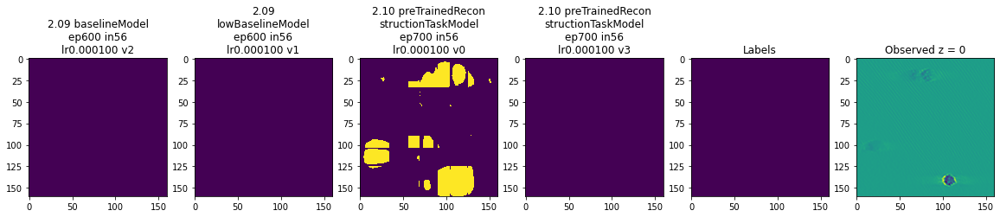

<Figure size 432x288 with 0 Axes>

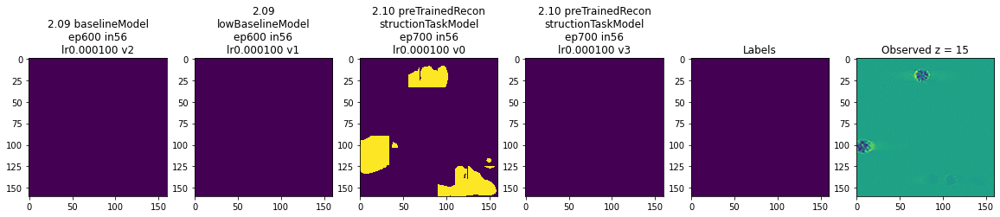

<Figure size 432x288 with 0 Axes>

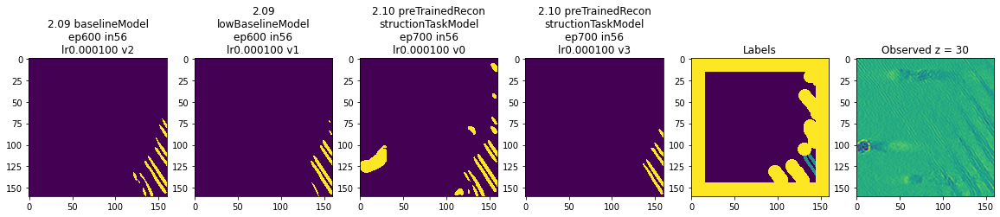

<Figure size 432x288 with 0 Axes>

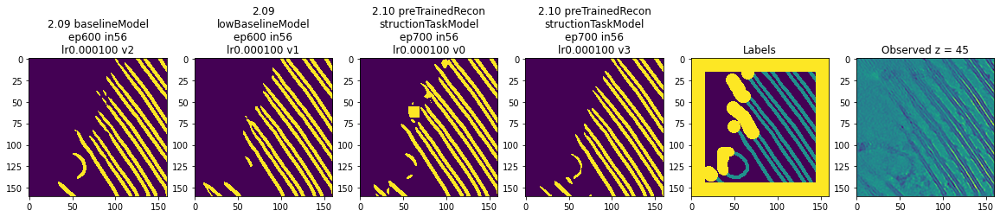

<Figure size 432x288 with 0 Axes>

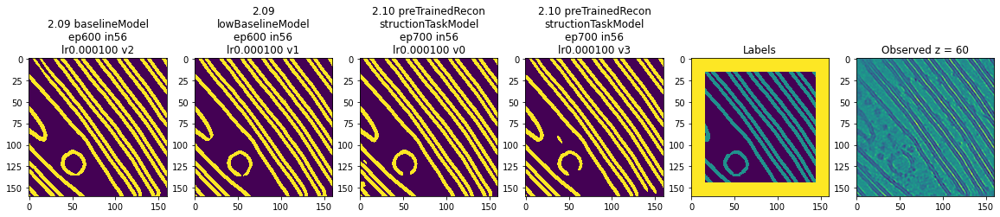

<Figure size 432x288 with 0 Axes>

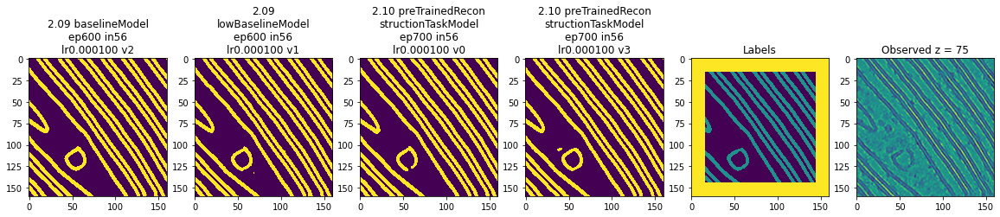

<Figure size 432x288 with 0 Axes>

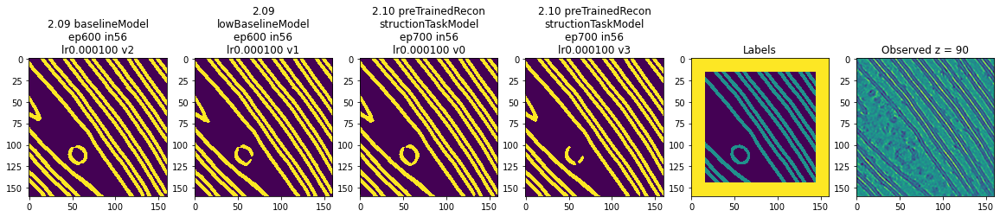

<Figure size 432x288 with 0 Axes>

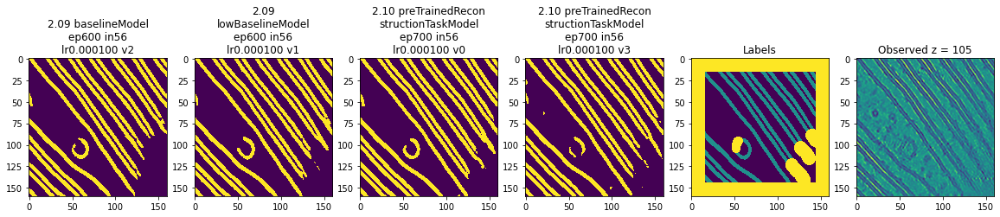

<Figure size 432x288 with 0 Axes>

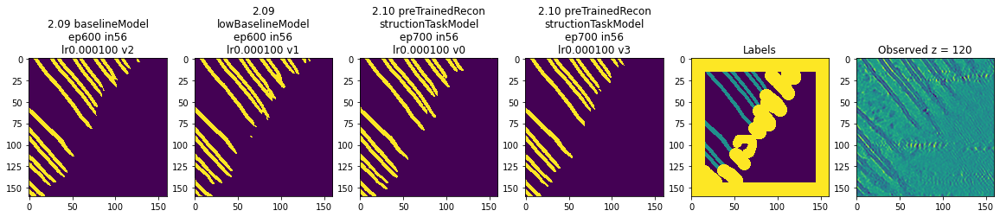

<Figure size 432x288 with 0 Axes>

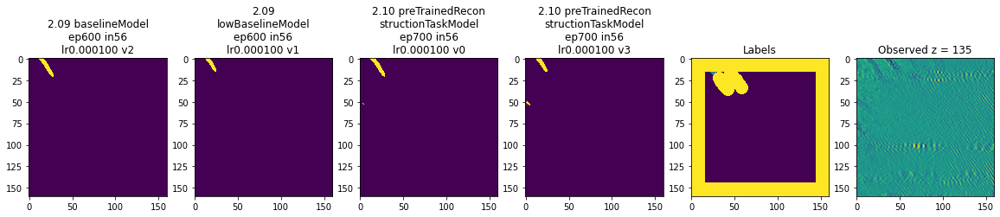

<Figure size 432x288 with 0 Axes>

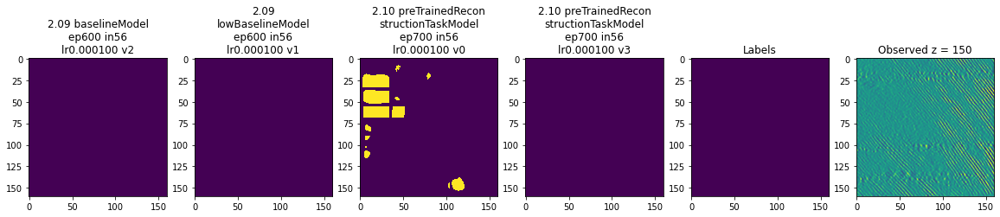

<Figure size 432x288 with 0 Axes>

In [11]:
make_comparison_plot(class1_predDict, class1, tomogram_data)

In [29]:
write_comparison_gif(class1_predDict, class1, tomogram_data)

100%|██████████| 160/160 [01:45<00:00,  1.52it/s]


Removing Images

DONE


<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

# Full test tomogram prediction

In [4]:
from deepfinder.dataloader_pylit import DeepFinder_dataset, to_categorical, transpose_to_channels_first

def fullTomogram_modelComparison2(model_fileList, n_centers_list, tomo_file, label_file, is_model_data=True):
    
    tomogram_data, classes = load_tomoData(tomo_file, label_file, is_model_data)

    z, y, x = tomogram_data.shape

    classes = torch.tensor(classes)
    Nclass_data = int(classes.max()+1)


    classes = transpose_to_channels_first(to_categorical(classes, num_classes=Nclass_data))

    y_true = torch.zeros((1, Nclass_data, z, y, x))
    y_true[0, :, :, :, :] = classes

    weight_decay = 0

    class_predDict = {}
    dice1_dict = {}

    for model_file, n_centers in zip(model_fileList, n_centers_list):
        Nclass_model = 3
        model = load_model(model_file,  Nclass_model, weight_decay)
        model_name = model_file.split('/')[-1].replace('.model', '')

        dim_in = int(model_file.split('in')[-1].split('_')[0])
        
        class_pred = predict_fullTomogram(tomogram_data, model, dim_in, n_centers, Nclass_model)
        print('Saving model predictions...')
        save_classPred(class_pred, model_name, tomo_file, True)

        class_predDict[model_name] = class_pred

        y_pred = torch.zeros((1, Nclass_model, z, y, x))
        y_pred[0, :, :, :, :] = transpose_to_channels_first(to_categorical(class_pred, Nclass_model))
        
        Nclass = min(Nclass_data, Nclass_model)
        
        y_true = y_true[:, 0:Nclass, :, :, :]
        y_pred = y_pred[:, 0:Nclass, :, :, :]

        dice1 = Tversky_index(y_true, y_pred)
        dice1_dict[model_name] = dice1

    tomo_name = tomo_file.split('/')[-1]

    # if x<200:
    #     _ = write_comparison_gif(class1_predDict, class1, tomogram_data, tomo_name)
    
    return class_predDict, dice1_dict, classes, tomogram_data

In [5]:
# model_fileList = [PARENT_PATH+'models/2.09_baselineModel_ep600_in56_lr0.000100_v2.model',
#                   PARENT_PATH+'models/2.09_lowBaselineModel_ep600_in56_lr0.000100_v1.model',
#                   PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0.model']
n_centers_list = [20 for _ in range(len(model_fileList))]

tomo_file = '/home/haicu/jeronimo.carvajal/Thesis/data/nnUnet/nifti_files/tomo38_bin4_denoised_0000.nii.gz'
label_file = '/home/haicu/jeronimo.carvajal/Thesis/data/nnUnet/nifti_files/tomo38_merged_thr02.nii.gz'

class1_predDict, dice1_dict, classes, tomogram_data = fullTomogram_modelComparison2(model_fileList, n_centers_list, tomo_file, label_file, False)

Tomogram shape:  (464, 928, 928)
Predicting full tomogram using 20 centers...


100%|██████████| 4000/4000 [01:03<00:00, 62.98it/s]


Saving model predictions...
Predicting full tomogram using 20 centers...


100%|██████████| 4000/4000 [01:02<00:00, 64.14it/s]


Saving model predictions...
Predicting full tomogram using 20 centers...


100%|██████████| 4000/4000 [01:03<00:00, 63.09it/s]


Saving model predictions...
Predicting full tomogram using 20 centers...


100%|██████████| 4000/4000 [01:02<00:00, 63.53it/s]


Saving model predictions...


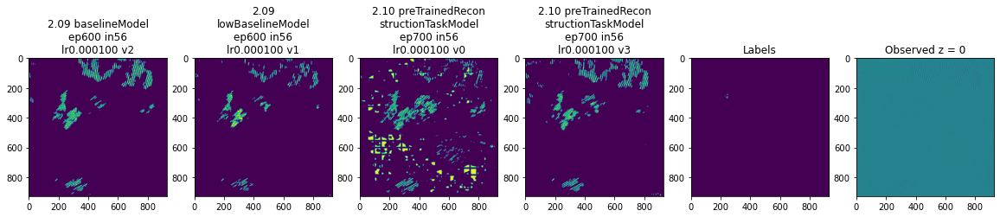

<Figure size 432x288 with 0 Axes>

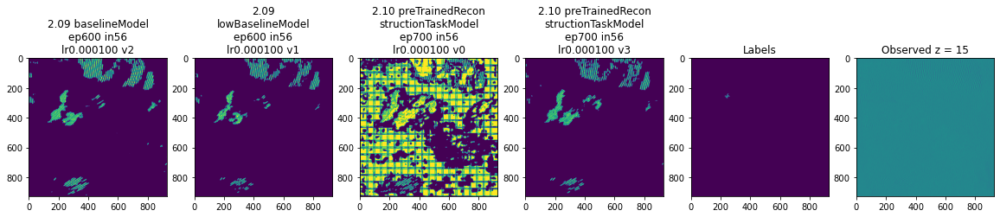

<Figure size 432x288 with 0 Axes>

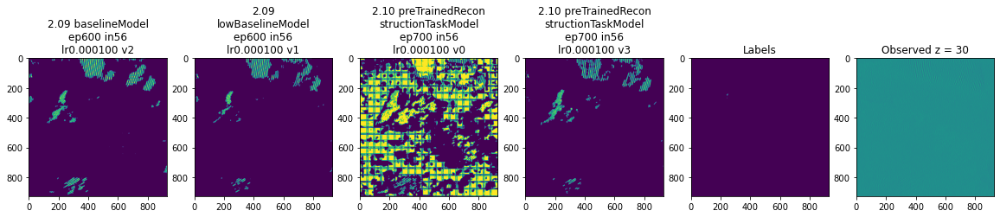

<Figure size 432x288 with 0 Axes>

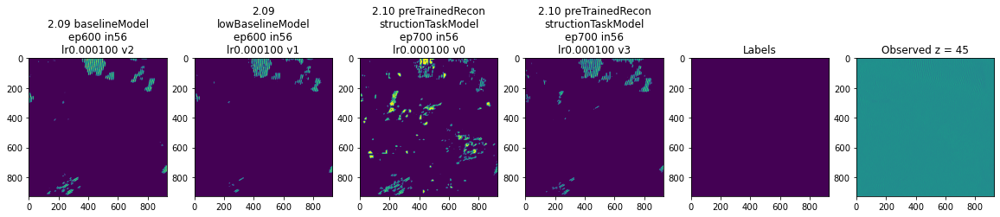

<Figure size 432x288 with 0 Axes>

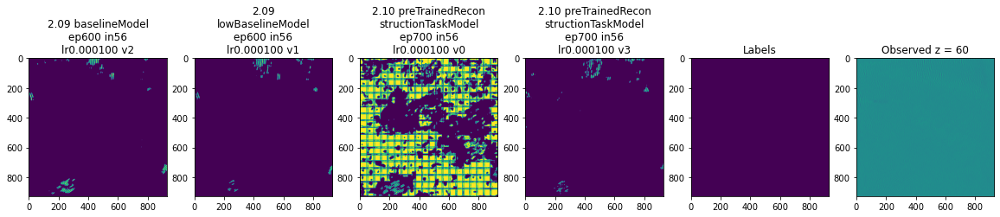

<Figure size 432x288 with 0 Axes>

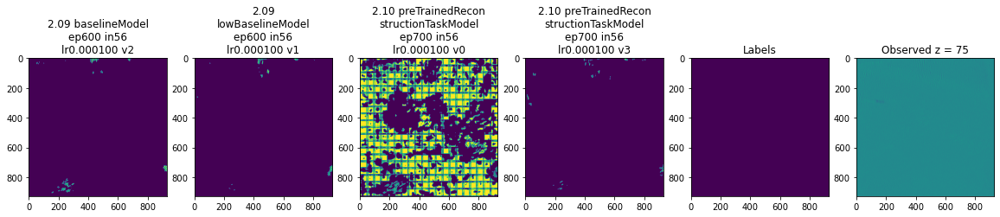

<Figure size 432x288 with 0 Axes>

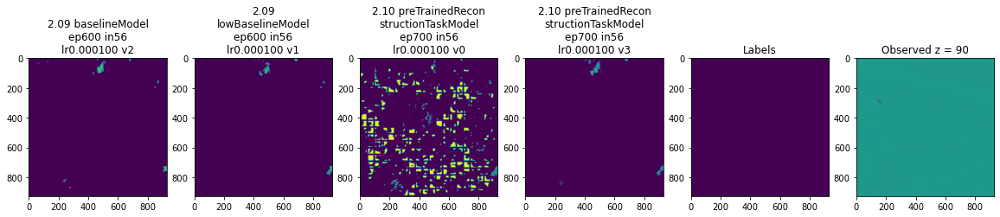

<Figure size 432x288 with 0 Axes>

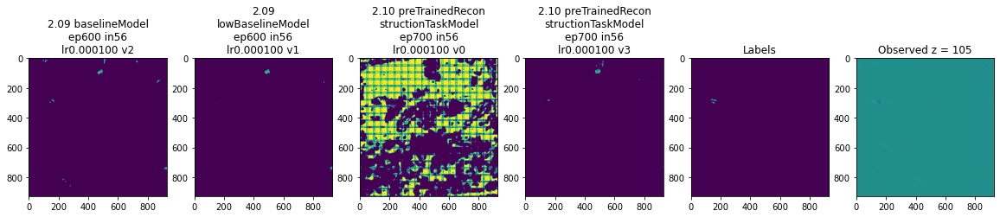

<Figure size 432x288 with 0 Axes>

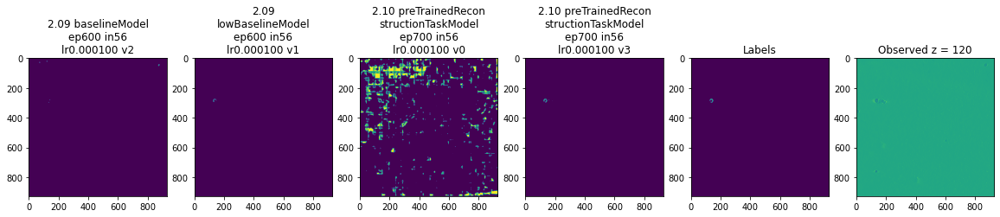

<Figure size 432x288 with 0 Axes>

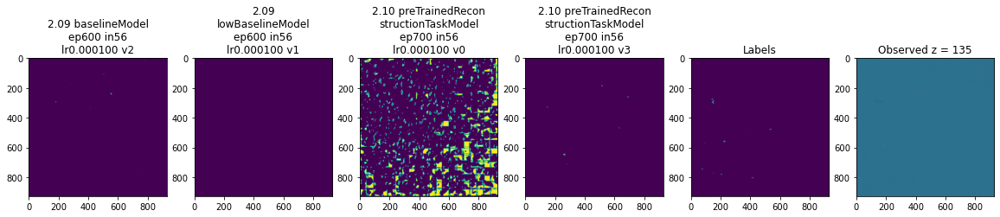

<Figure size 432x288 with 0 Axes>

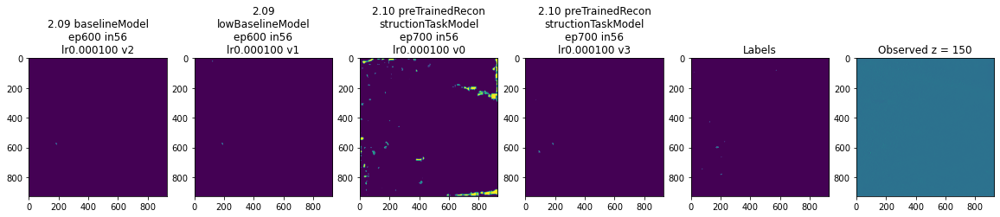

<Figure size 432x288 with 0 Axes>

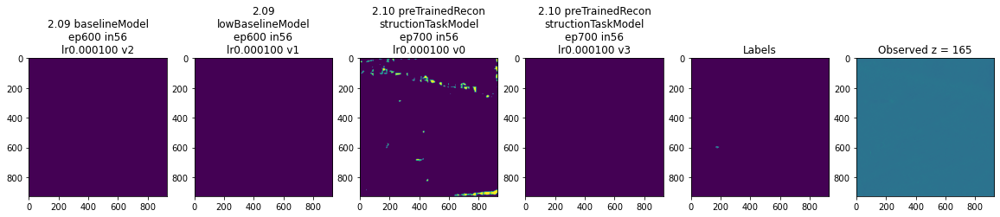

<Figure size 432x288 with 0 Axes>

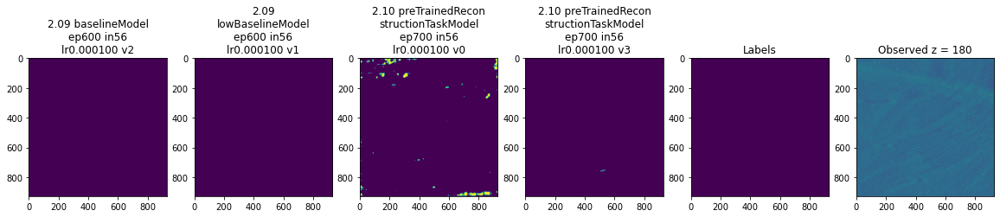

<Figure size 432x288 with 0 Axes>

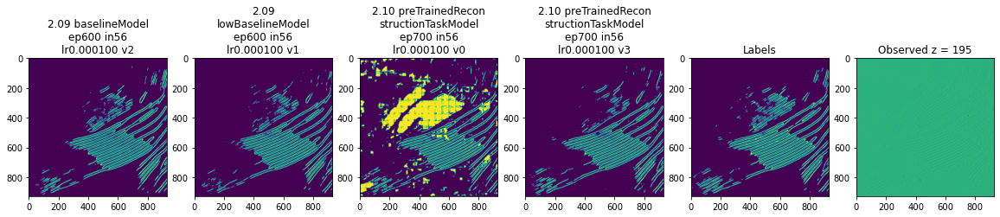

<Figure size 432x288 with 0 Axes>

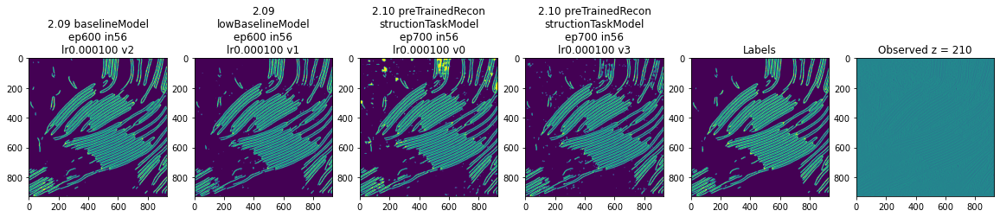

<Figure size 432x288 with 0 Axes>

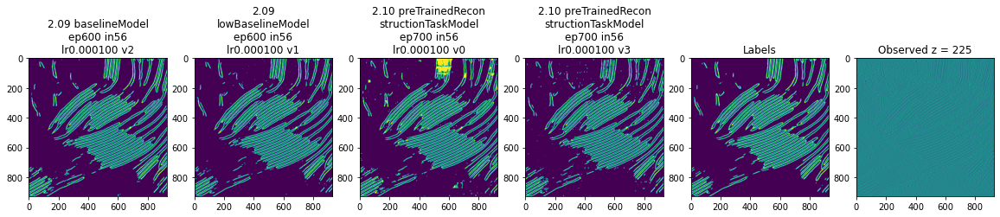

<Figure size 432x288 with 0 Axes>

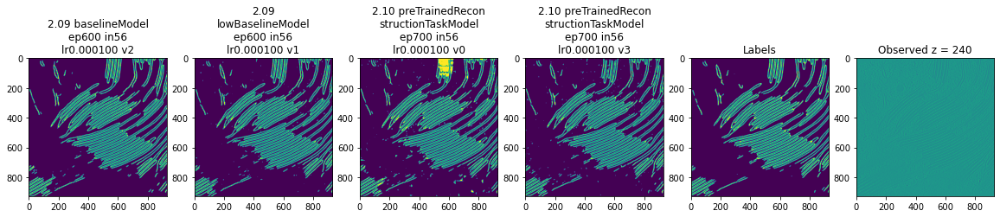

<Figure size 432x288 with 0 Axes>

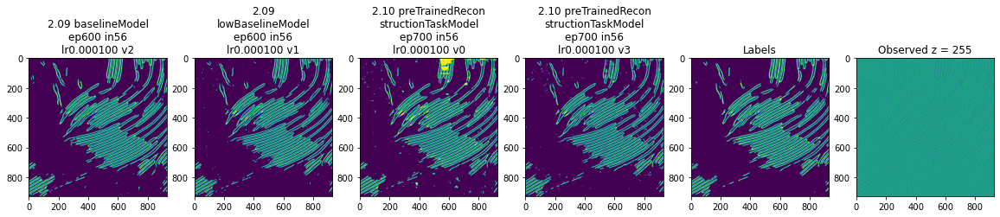

<Figure size 432x288 with 0 Axes>

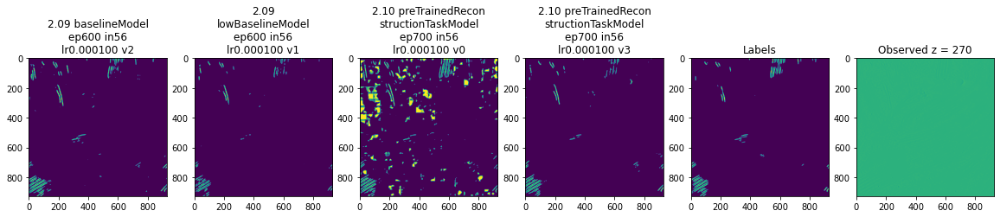

<Figure size 432x288 with 0 Axes>

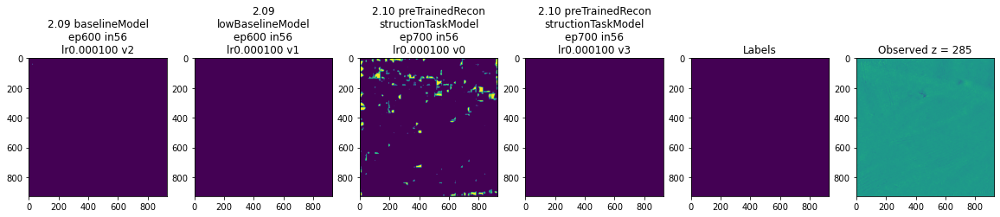

<Figure size 432x288 with 0 Axes>

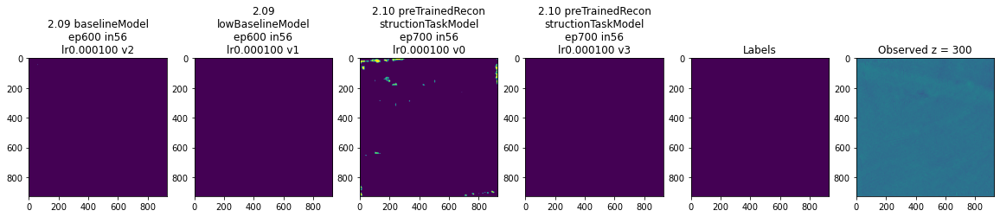

<Figure size 432x288 with 0 Axes>

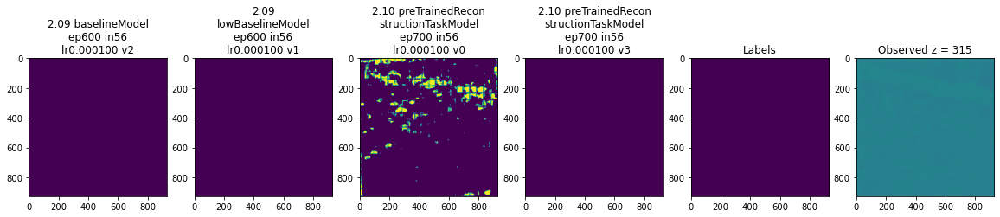

<Figure size 432x288 with 0 Axes>

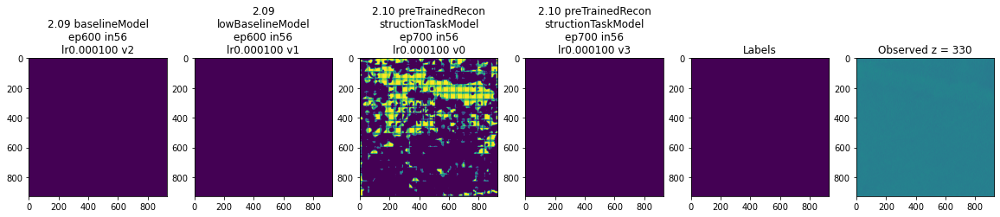

<Figure size 432x288 with 0 Axes>

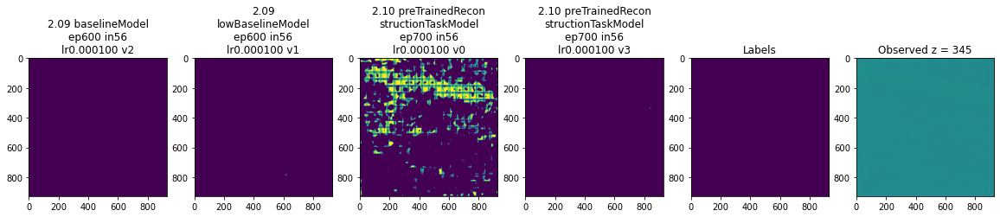

<Figure size 432x288 with 0 Axes>

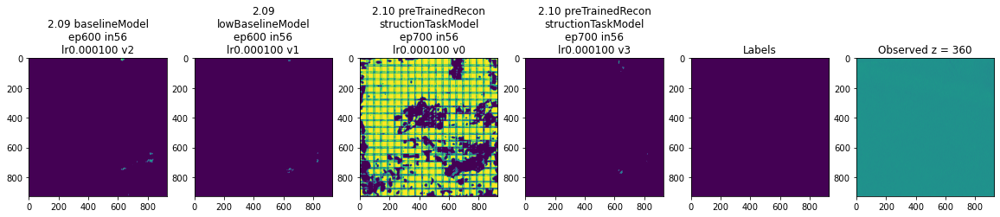

<Figure size 432x288 with 0 Axes>

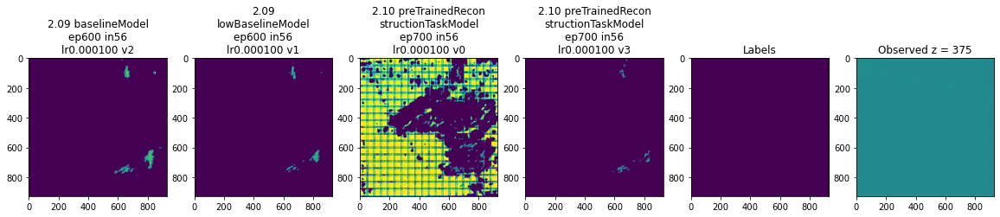

<Figure size 432x288 with 0 Axes>

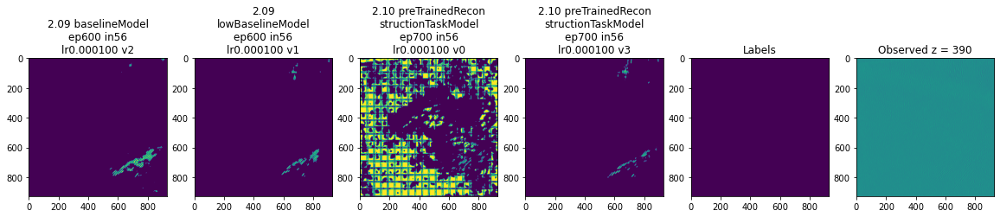

<Figure size 432x288 with 0 Axes>

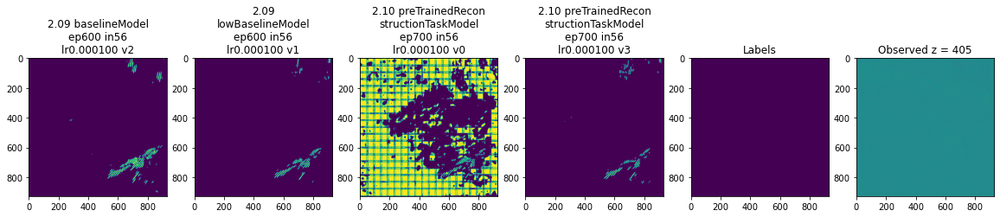

<Figure size 432x288 with 0 Axes>

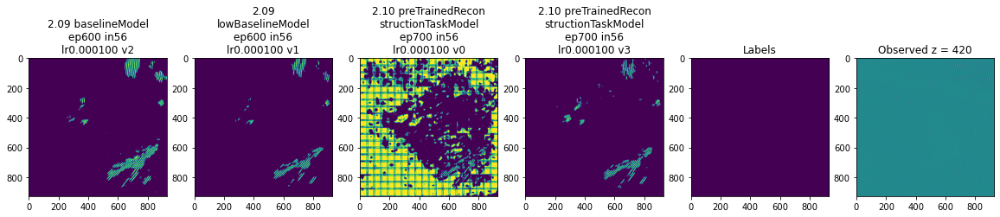

<Figure size 432x288 with 0 Axes>

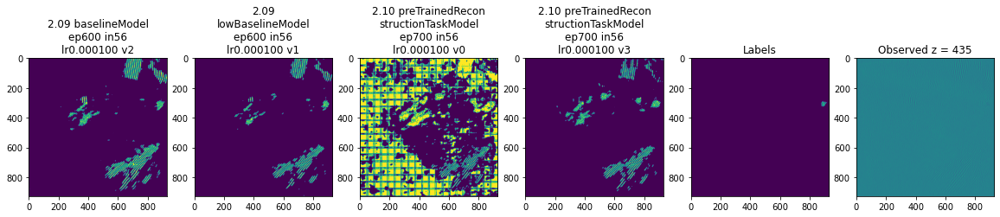

<Figure size 432x288 with 0 Axes>

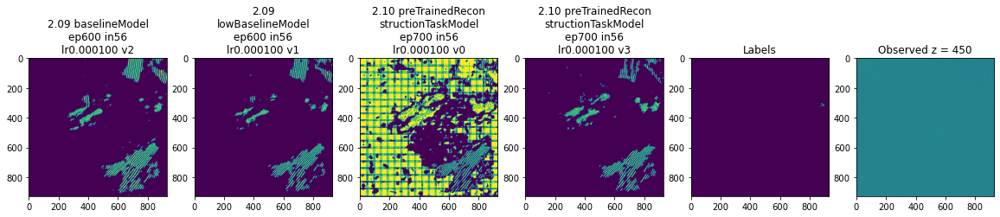

<Figure size 432x288 with 0 Axes>

In [6]:
make_comparison_plot(class1_predDict, classes, tomogram_data)

In [7]:
dice1_dict

{'2.09_baselineModel_ep600_in56_lr0.000100_v2': tensor([0.9929, 0.7836], device='cuda:0'),
 '2.09_lowBaselineModel_ep600_in56_lr0.000100_v1': tensor([0.9943, 0.8123], device='cuda:0'),
 '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0': tensor([0.8655, 0.1758], device='cuda:0'),
 '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3': tensor([0.9935, 0.7883], device='cuda:0')}

In [3]:
model_file = PARENT_PATH+'models/2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v3.model'
model = load_model(model_file, 3, 0)

tomogram_data, classes = load_tomoData(tomo_file, label_file, False)

NameError: name 'tomo_file' is not defined

In [7]:
z, y, x = tomogram_data.shape

classes = torch.tensor(classes)
Nclass_data = int(classes.max()+1)
Nclass_data

2

In [8]:
classes = transpose_to_channels_first(to_categorical(classes, num_classes=Nclass_data))

y_true = torch.zeros((1, Nclass_data, z, y, x))
y_true[0, :, :, :, :] = classes

y_true.shape

torch.Size([1, 2, 464, 928, 928])

In [11]:
model_name = model_file.split('/')[-1].replace('.model', '')

dim_in = int(model_file.split('in')[-1].split('_')[0])
n_centers = 20
Nclass_model = 3

class_pred = predict_fullTomogram(tomogram_data, model, dim_in, n_centers, Nclass_model)
class_pred.shape

Predicting full tomogram using 20 centers...


100%|██████████| 4000/4000 [01:56<00:00, 34.43it/s]


(464, 928, 928)

In [18]:
np.unique(class_pred[0])

array([0, 1])

In [15]:
# print('Saving model predictions...')
# save_classPred(class_pred, model_name, tomo_file, True)

# class_predDict[model_name] = class_pred

y_pred = torch.zeros((1, Nclass_model, z, y, x))
y_pred[0, :, :, :, :] = transpose_to_channels_first(to_categorical(class_pred, Nclass_model))

y_pred.shape

torch.Size([1, 3, 464, 928, 928])

In [ ]:
Nclass = min(Nclass_data, Nclass_model)

y_true = y_true[:, 0:Nclass, :, :, :]
y_pred = y_pred[:, 0:Nclass, :, :, :]

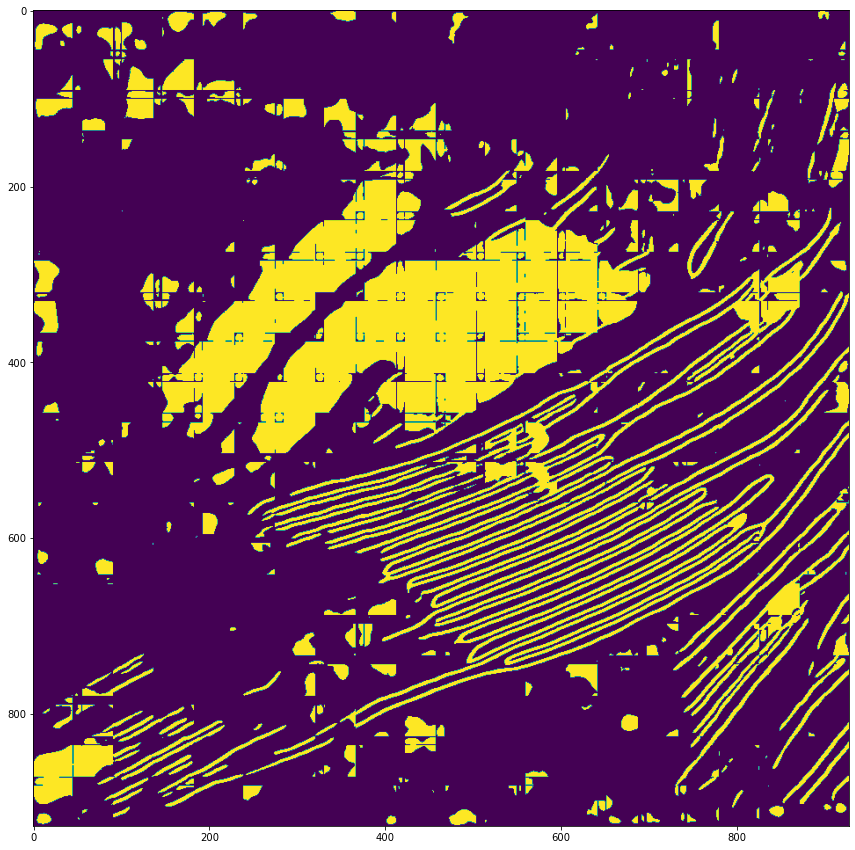

In [28]:
plt.figure(figsize=(15, 15))
plt.imshow(class_pred[195], cmap='viridis')


In [24]:
np.unique(class_pred[15])

array([0, 1])

In [16]:
dice1_dict

{'2.09_baselineModel_ep600_in56_lr0.000100_v2': tensor([0.9929, 0.7836], device='cuda:0'),
 '2.09_lowBaselineModel_ep600_in56_lr0.000100_v1': tensor([0.9943, 0.8123], device='cuda:0'),
 '2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0': tensor([0.8655, 0.1758], device='cuda:0')}

In [19]:
np.unique(dice1_dict['2.10_preTrainedReconstructionTaskModel_ep700_in56_lr0.000100_v0'].cpu().detach().numpy())

array([0.17583719, 0.865528  ], dtype=float32)

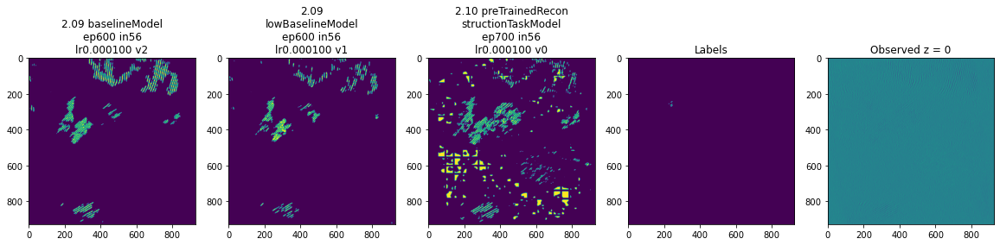

<Figure size 432x288 with 0 Axes>

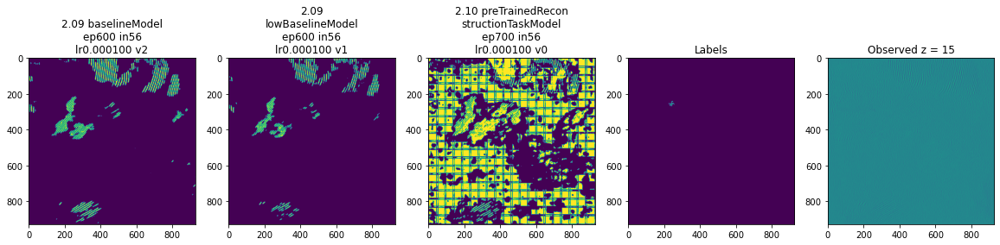

<Figure size 432x288 with 0 Axes>

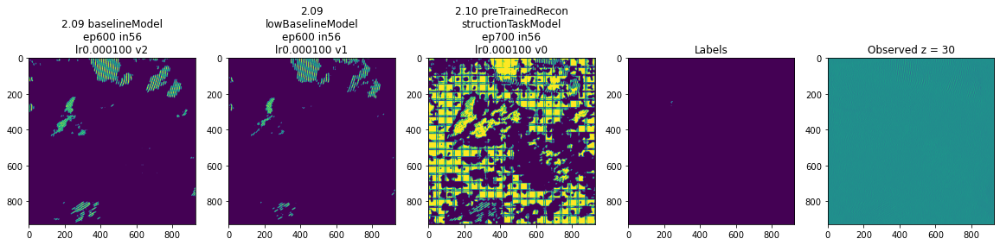

<Figure size 432x288 with 0 Axes>

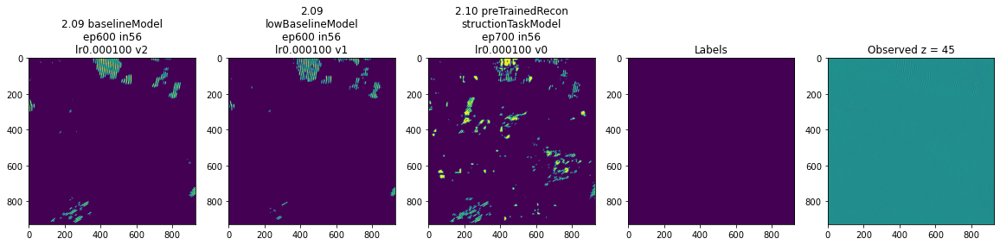

<Figure size 432x288 with 0 Axes>

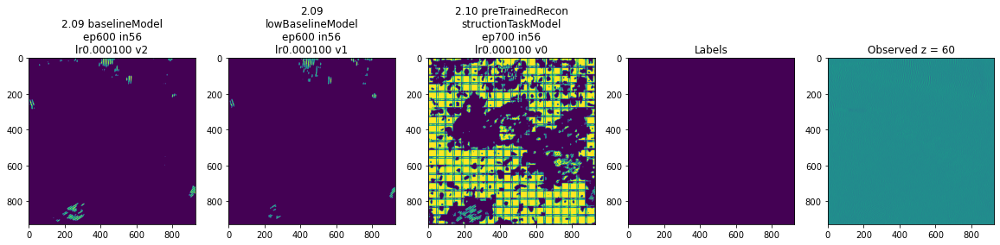

<Figure size 432x288 with 0 Axes>

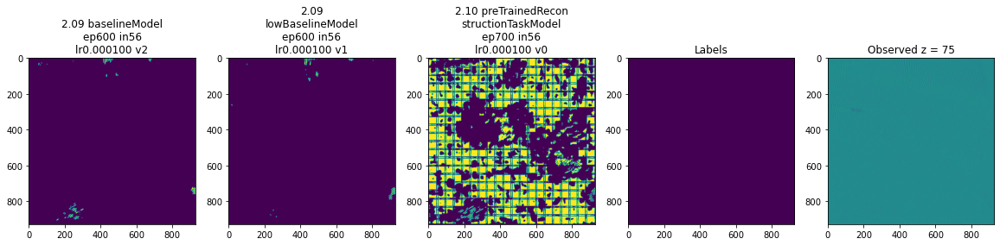

<Figure size 432x288 with 0 Axes>

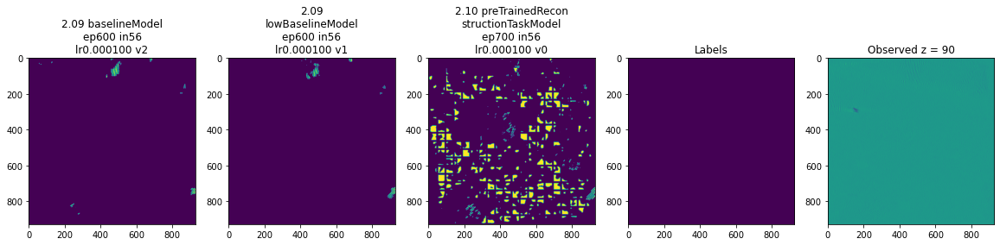

<Figure size 432x288 with 0 Axes>

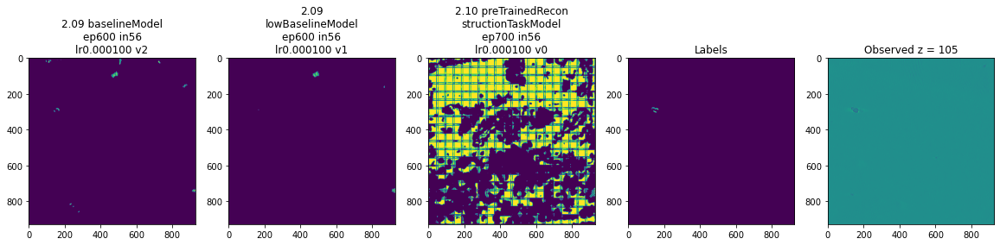

<Figure size 432x288 with 0 Axes>

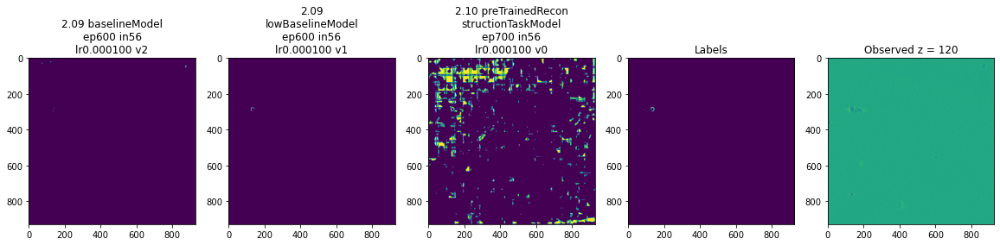

<Figure size 432x288 with 0 Axes>

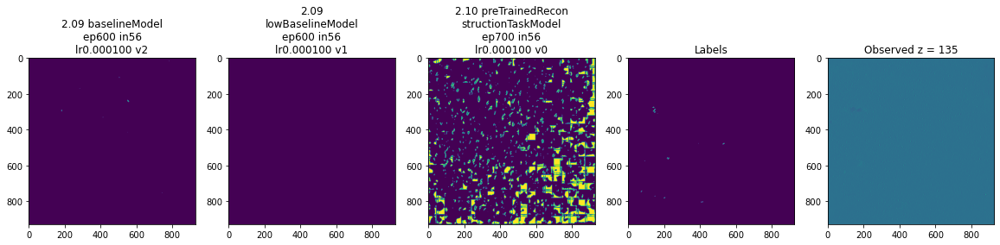

<Figure size 432x288 with 0 Axes>

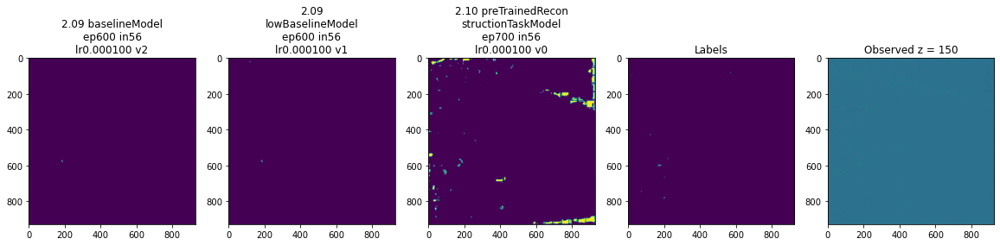

<Figure size 432x288 with 0 Axes>

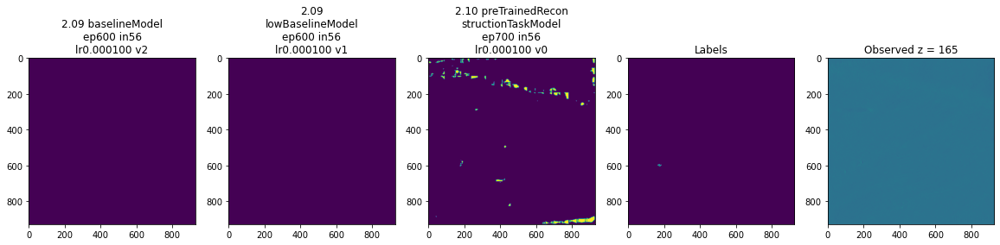

<Figure size 432x288 with 0 Axes>

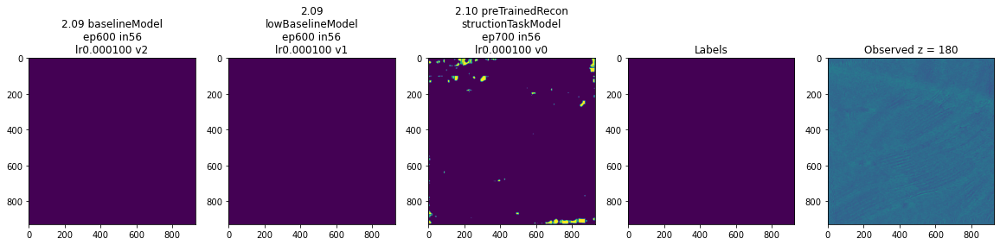

<Figure size 432x288 with 0 Axes>

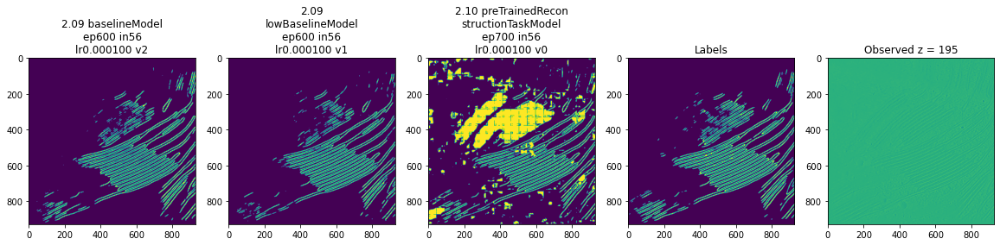

<Figure size 432x288 with 0 Axes>

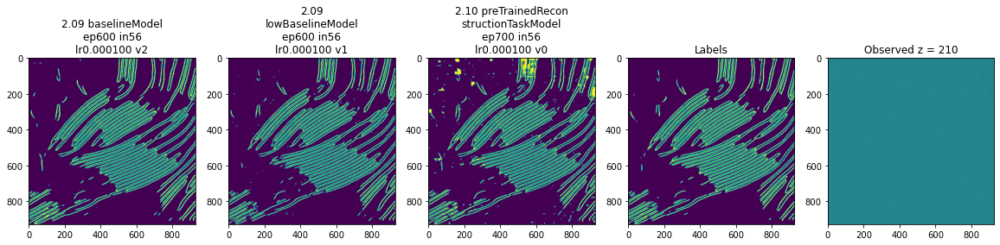

<Figure size 432x288 with 0 Axes>

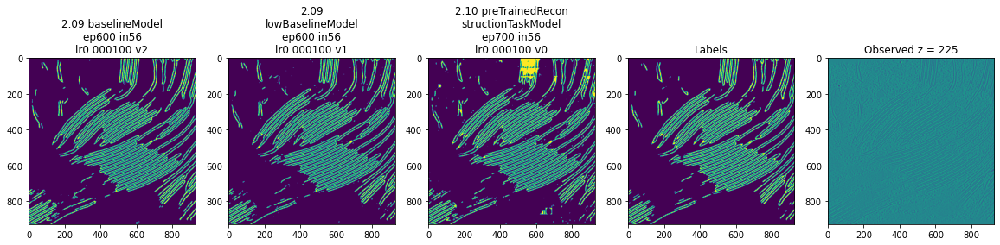

<Figure size 432x288 with 0 Axes>

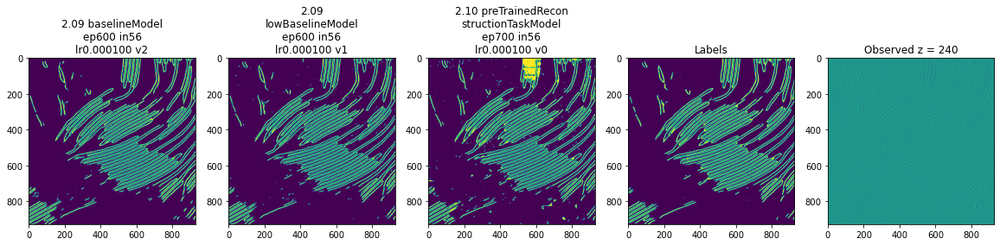

<Figure size 432x288 with 0 Axes>

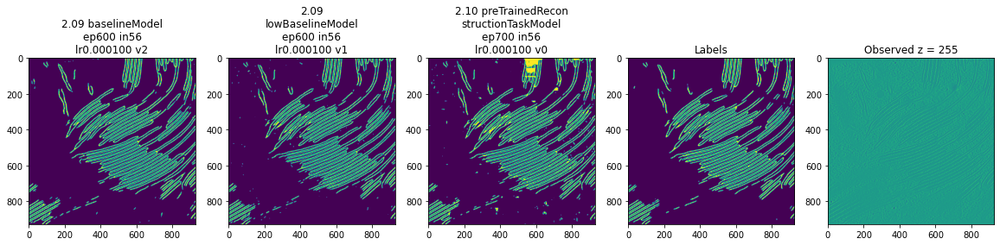

<Figure size 432x288 with 0 Axes>

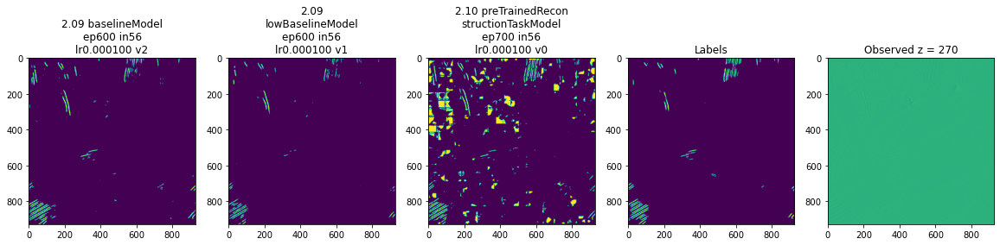

<Figure size 432x288 with 0 Axes>

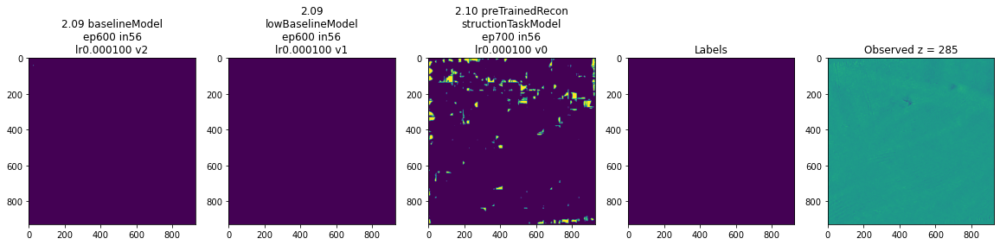

<Figure size 432x288 with 0 Axes>

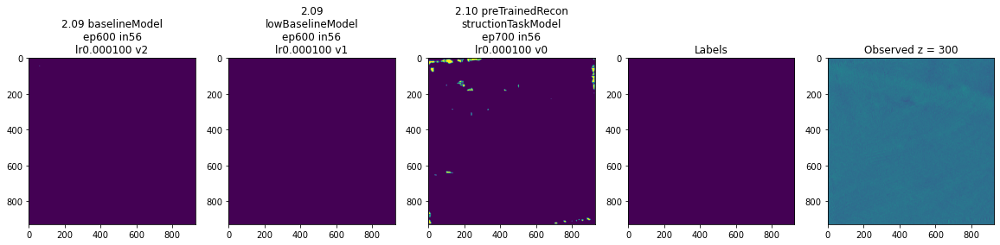

<Figure size 432x288 with 0 Axes>

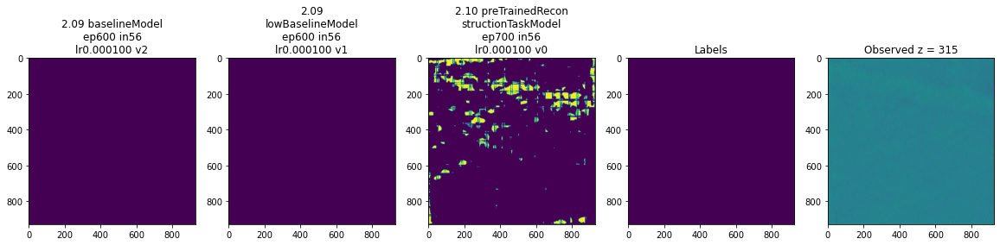

<Figure size 432x288 with 0 Axes>

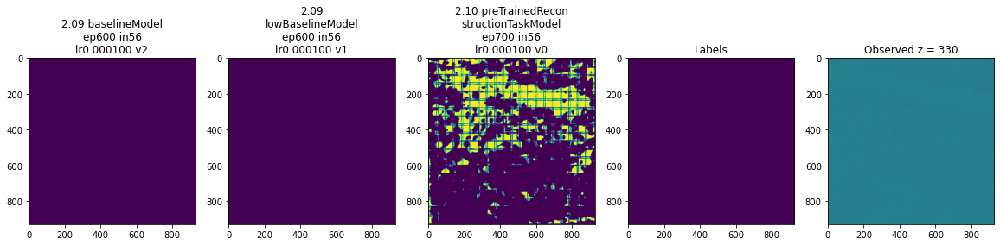

<Figure size 432x288 with 0 Axes>

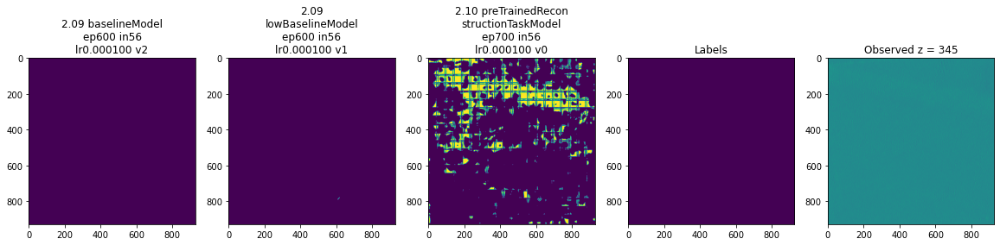

<Figure size 432x288 with 0 Axes>

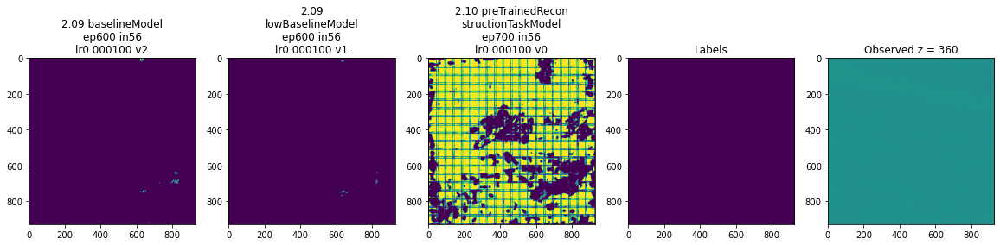

<Figure size 432x288 with 0 Axes>

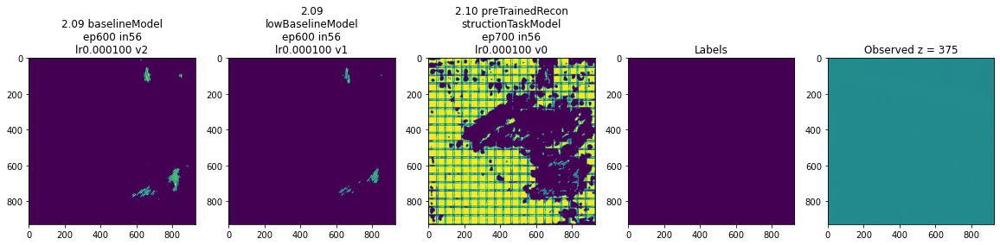

<Figure size 432x288 with 0 Axes>

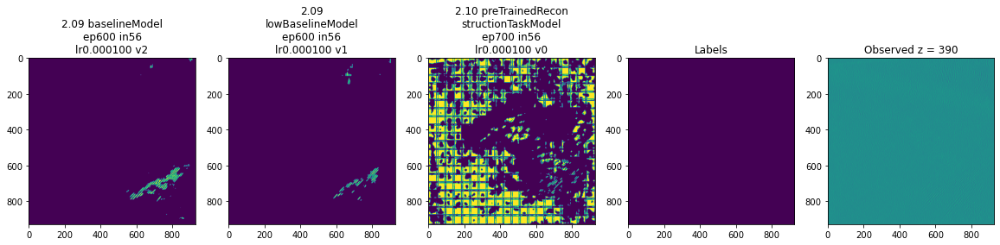

<Figure size 432x288 with 0 Axes>

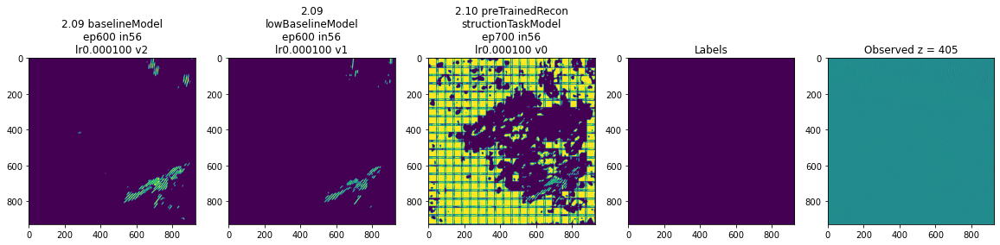

<Figure size 432x288 with 0 Axes>

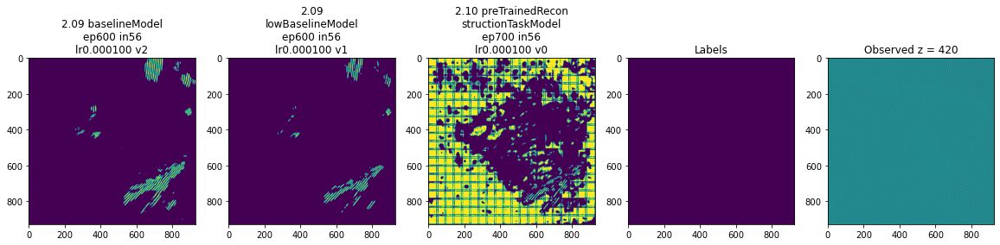

<Figure size 432x288 with 0 Axes>

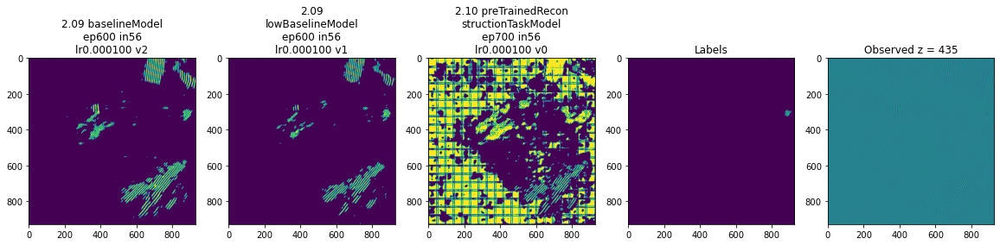

<Figure size 432x288 with 0 Axes>

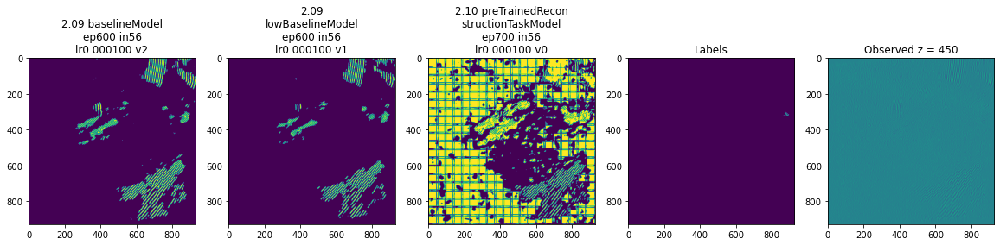

<Figure size 432x288 with 0 Axes>

In [17]:
make_comparison_plot(class1_predDict, classes, tomogram_data)